In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import TensorBoard


In [ ]:
path_to_data = "/content/drive/My Drive/ColabNotebooks/Augmentกระเบื้อง"

In [ ]:
data_gen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,  # splitting 20% for validation
    rotation_range=20,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    fill_mode="nearest"
)
train_gen = data_gen.flow_from_directory(
    path_to_data,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

val_gen = data_gen.flow_from_directory(
    path_to_data,
    target_size=(128, 128),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

Found 824 images belonging to 3 classes.
Found 205 images belonging to 3 classes.


In [ ]:
# Load pre-trained model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

# Freeze the base model
for layer in base_model.layers:
    layer.trainable = False

# Create custom layers on top
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(3, activation='softmax')(x)  # Assuming 3 classes

# Final model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


9406464/9406464 [==============================] - 1s 0us/step


In [ ]:
history = model.fit(train_gen, validation_data=val_gen, epochs=100)

Epoch 1/100
26/26 [==============================] - 338s 13s/step - loss: 1.0260 - accuracy: 0.6578 - val_loss: 0.4759 - val_accuracy: 0.8146
Epoch 2/100
26/26 [==============================] - 11s 422ms/step - loss: 0.4163 - accuracy: 0.8447 - val_loss: 0.4172 - val_accuracy: 0.8390
Epoch 3/100
26/26 [==============================] - 11s 423ms/step - loss: 0.3204 - accuracy: 0.8750 - val_loss: 0.3530 - val_accuracy: 0.8780
Epoch 4/100
26/26 [==============================] - 11s 422ms/step - loss: 0.3111 - accuracy: 0.8811 - val_loss: 0.4176 - val_accuracy: 0.8293
Epoch 5/100
26/26 [==============================] - 11s 422ms/step - loss: 0.2377 - accuracy: 0.9078 - val_loss: 0.4929 - val_accuracy: 0.8146
Epoch 6/100
26/26 [==============================] - 11s 423ms/step - loss: 0.2049 - accuracy: 0.9296 - val_loss: 0.4474 - val_accuracy: 0.8098
Epoch 7/100
26/26 [==============================] - 11s 423ms/step - loss: 0.2162 - accuracy: 0.9163 - val_loss: 0.5697 - val_accuracy: 

In [ ]:
model.save('tilemodel.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Load the saved model from the right path
model = tf.keras.models.load_model('tilemodel.h5')

# Define the prediction folder
#predict_folder = '/content/drive/MyDrive/ColabNotebooks/predict test'
predict_folder = '/content/drive/MyDrive/Dataset/คัดรูป(ของน้อง gen6)/กระเบื้อง/ตัวอย่างที่ผ่าน/Test_Picture_Edited'
# Assuming you have previously defined train_gen
label_map = train_gen.class_indices
label_map = dict((v, k) for k, v in label_map.items())  # Flip the key-value pairs

for image_filename in os.listdir(predict_folder):
    image_path = os.path.join(predict_folder, image_filename)
    if image_path.lower().endswith(('.png', '.jpg', '.jpeg')):  # Only predict for image files
        # Load the image and preprocess it
        image = tf.keras.preprocessing.image.load_img(image_path, target_size=(128, 128))  # Adjust size if needed
        image_array = tf.keras.preprocessing.image.img_to_array(image)
        image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
        image_array /= 255.0  # Normalize to [0, 1]

        # Make predictions
        predictions = model.predict(image_array)
        predicted_class_index = np.argmax(predictions[0])
        predicted_class_label = label_map[predicted_class_index]

        print(f"Image: {image_filename}, Predicted Class: {predicted_class_label}")

1/1 [==============================] - 1s 711ms/step


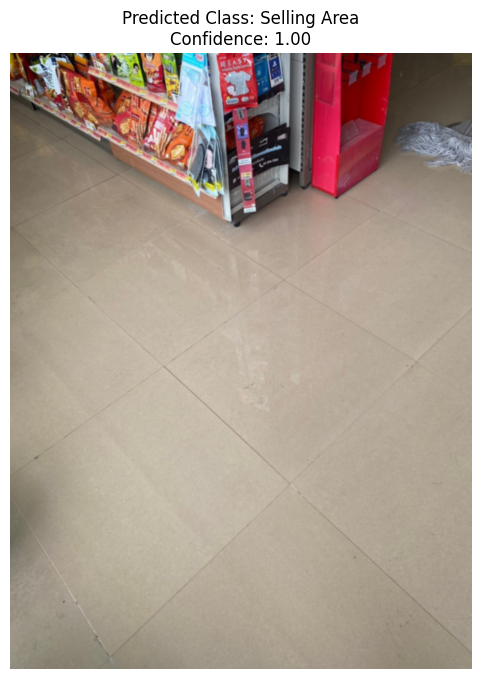

1/1 [==============================] - 0s 22ms/step


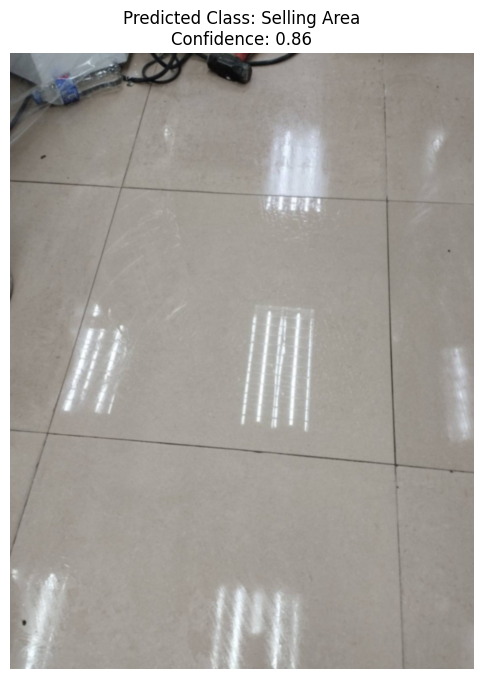

1/1 [==============================] - 0s 22ms/step


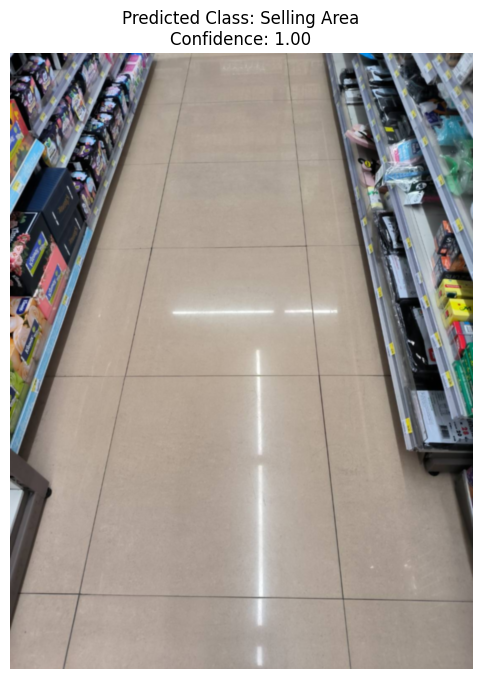

1/1 [==============================] - 0s 25ms/step


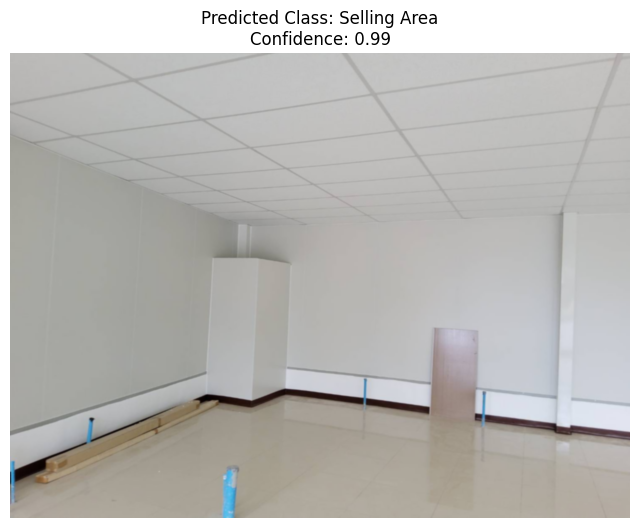

1/1 [==============================] - 0s 20ms/step


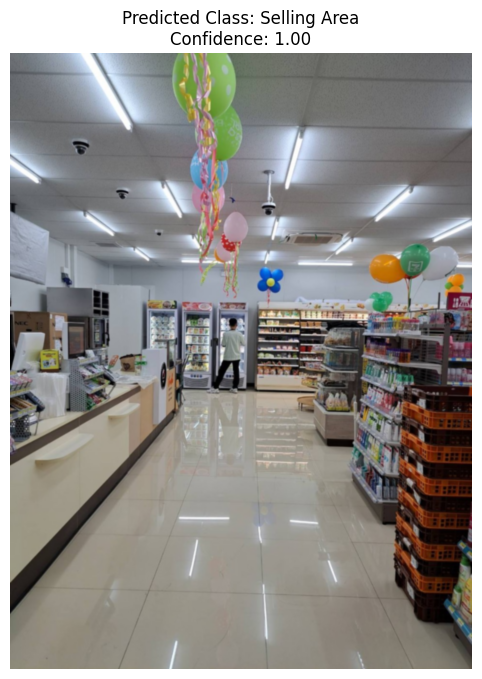

1/1 [==============================] - 0s 24ms/step


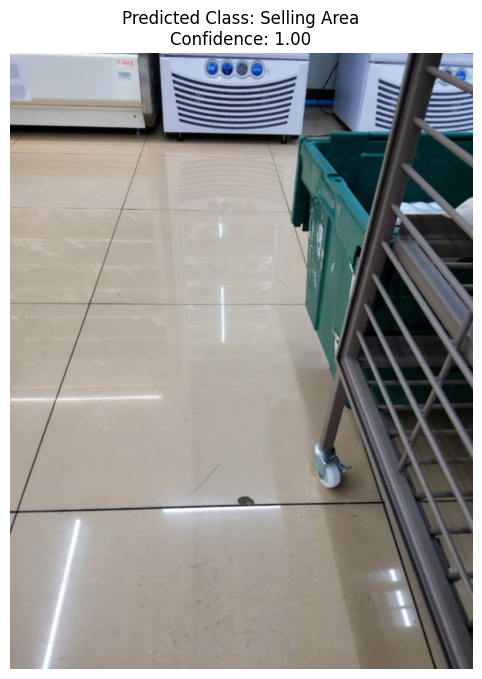

1/1 [==============================] - 0s 21ms/step


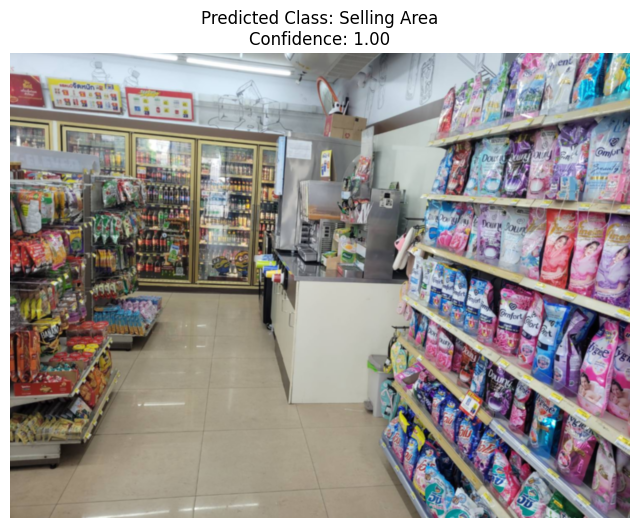

1/1 [==============================] - 0s 23ms/step


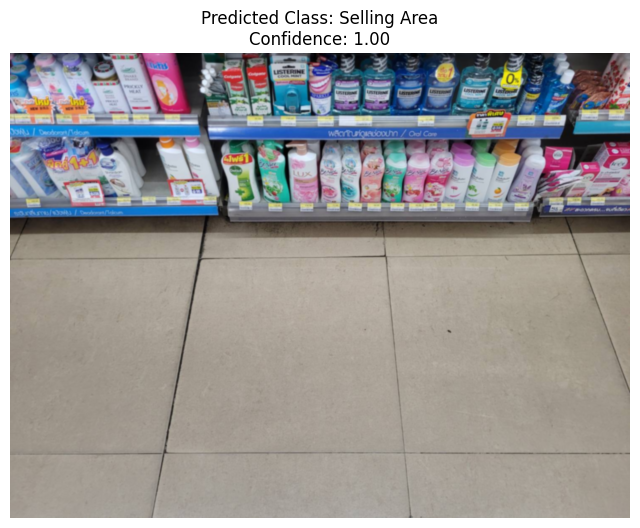

1/1 [==============================] - 0s 20ms/step


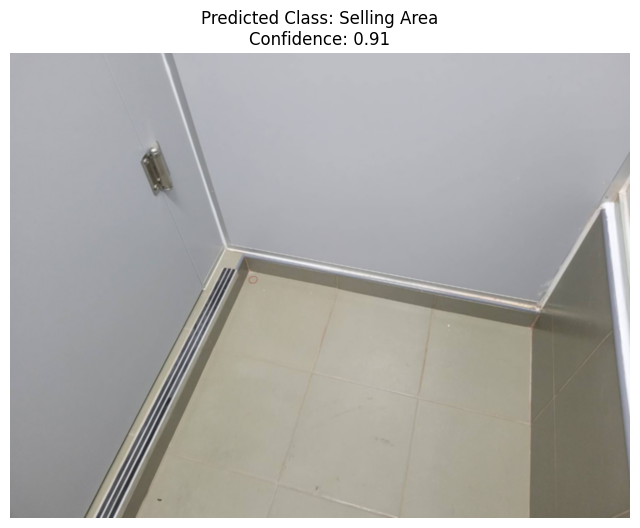

1/1 [==============================] - 0s 21ms/step


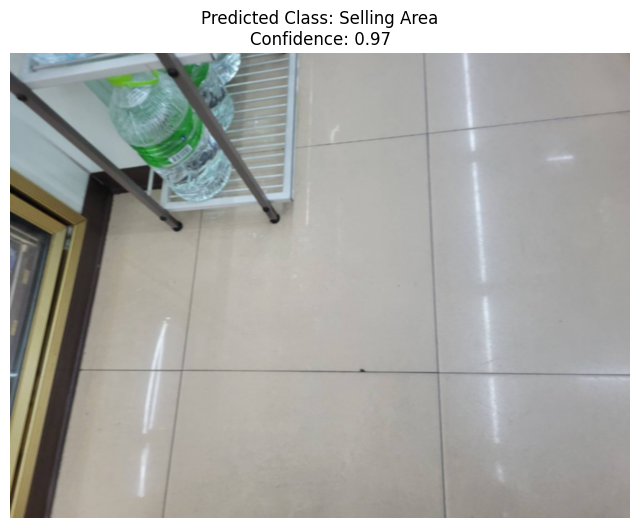

1/1 [==============================] - 0s 23ms/step


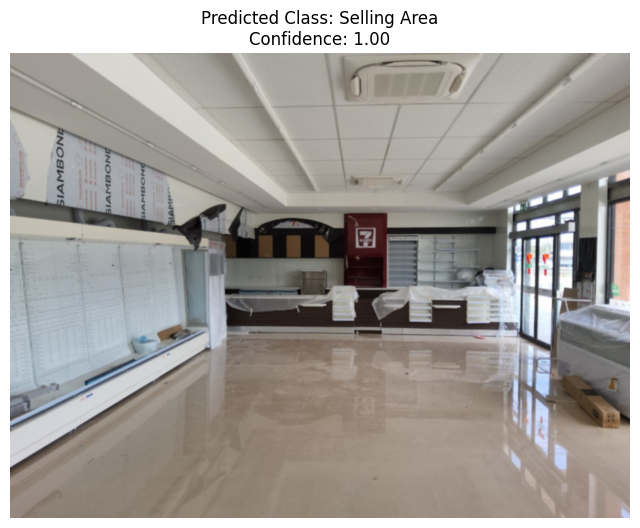

1/1 [==============================] - 0s 23ms/step


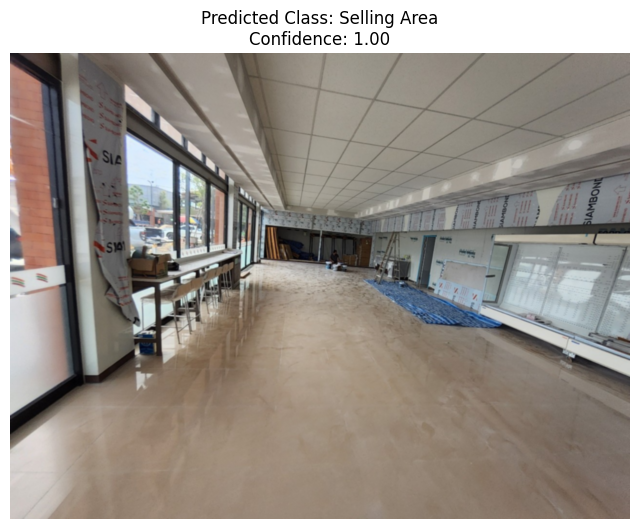

1/1 [==============================] - 0s 20ms/step


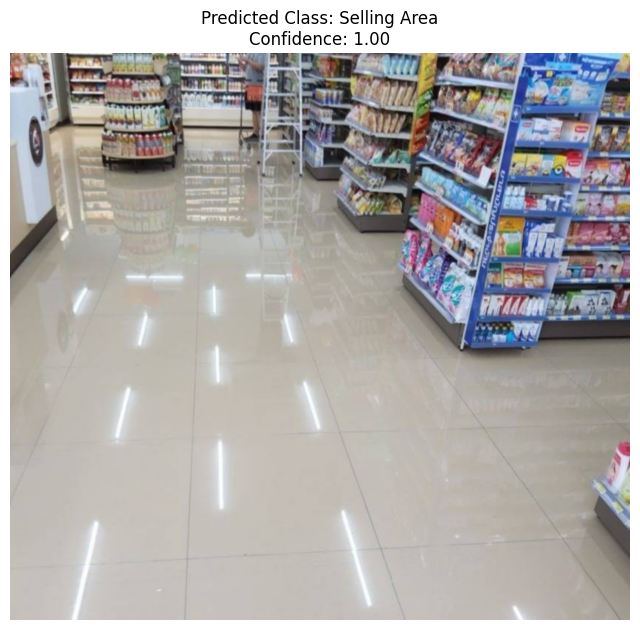

1/1 [==============================] - 0s 21ms/step


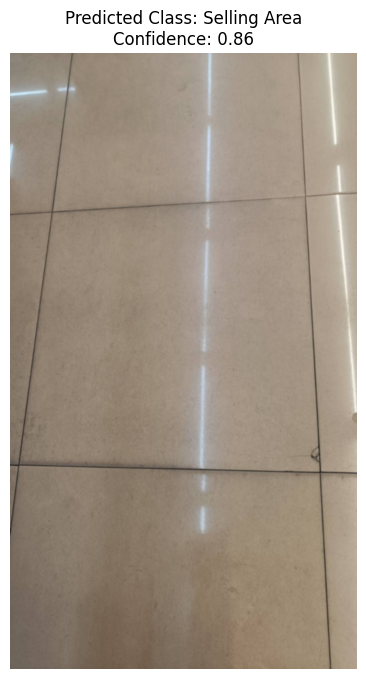

1/1 [==============================] - 0s 22ms/step


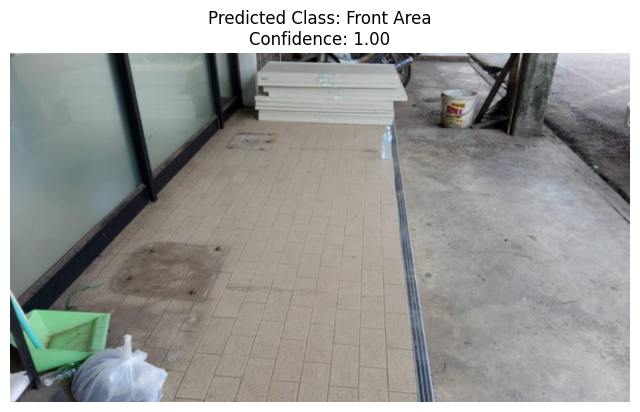

1/1 [==============================] - 0s 22ms/step


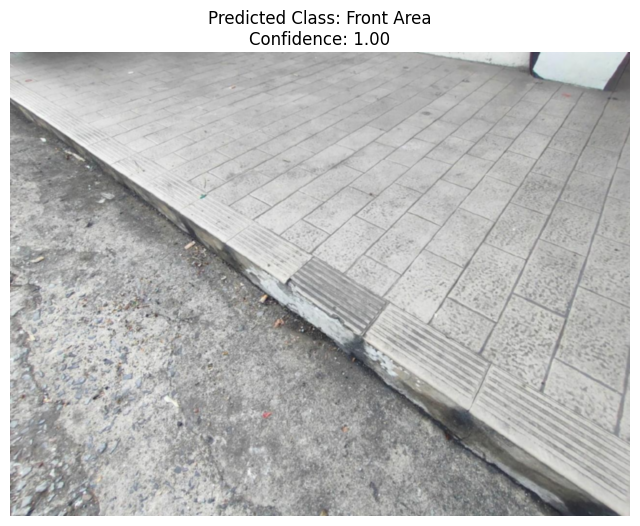

1/1 [==============================] - 0s 23ms/step


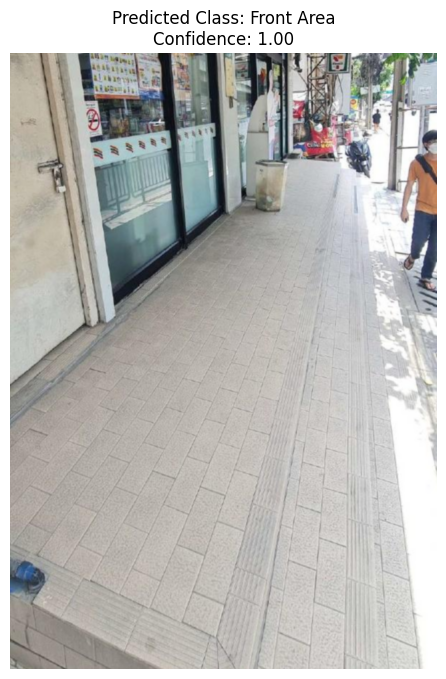

1/1 [==============================] - 0s 24ms/step


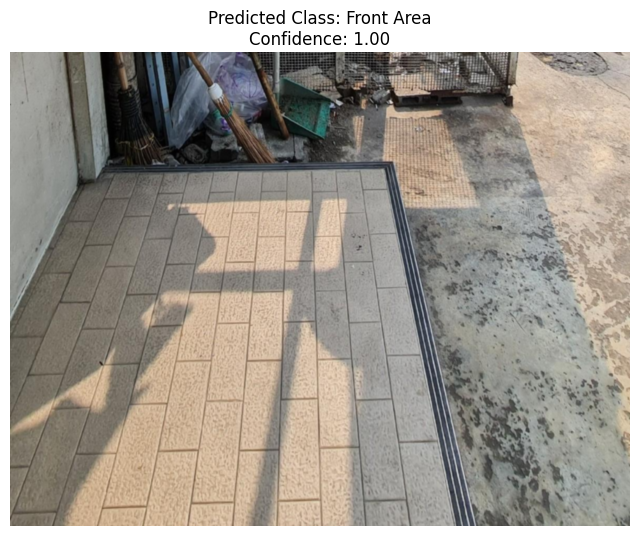

1/1 [==============================] - 0s 22ms/step


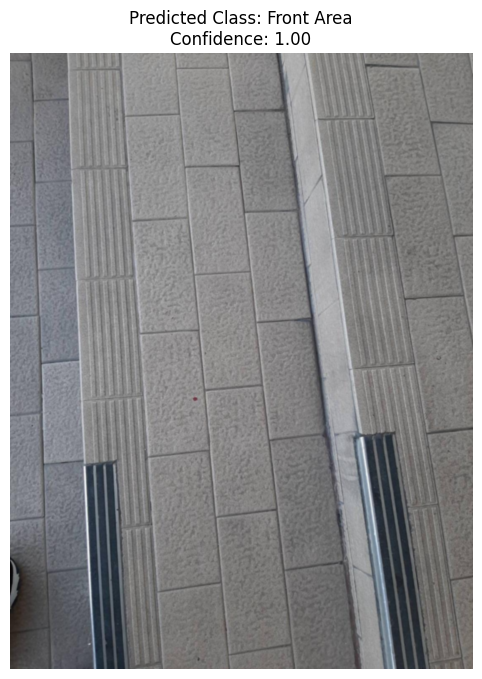

1/1 [==============================] - 0s 23ms/step


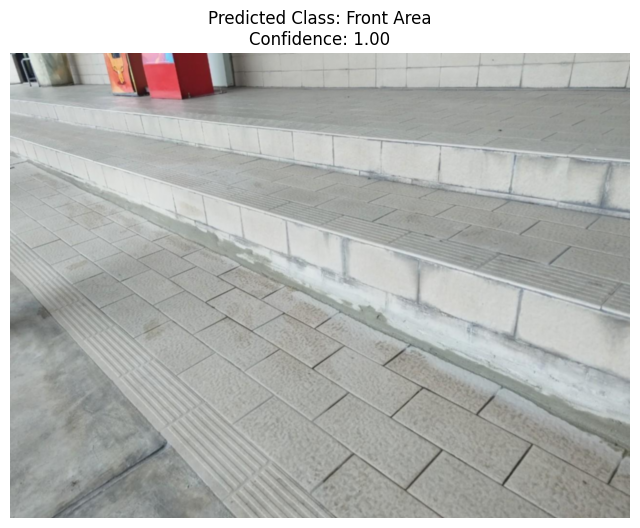

1/1 [==============================] - 0s 23ms/step


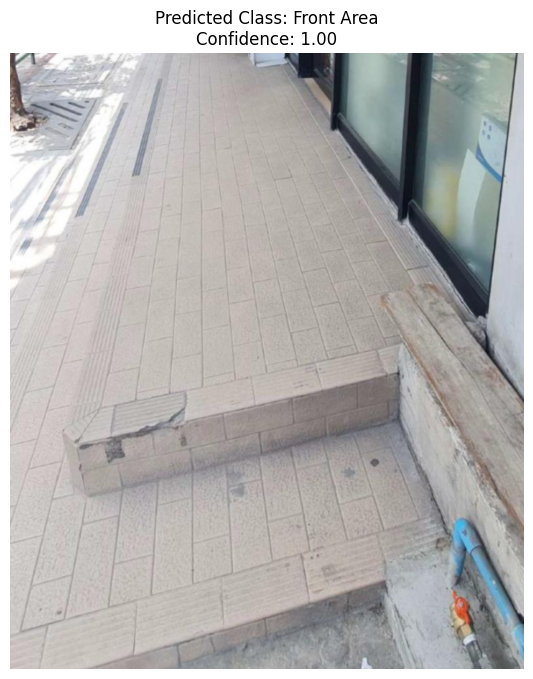

1/1 [==============================] - 0s 21ms/step


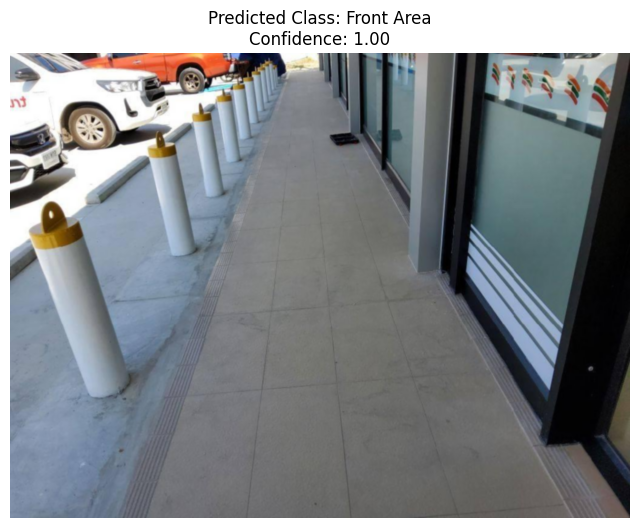

1/1 [==============================] - 0s 27ms/step


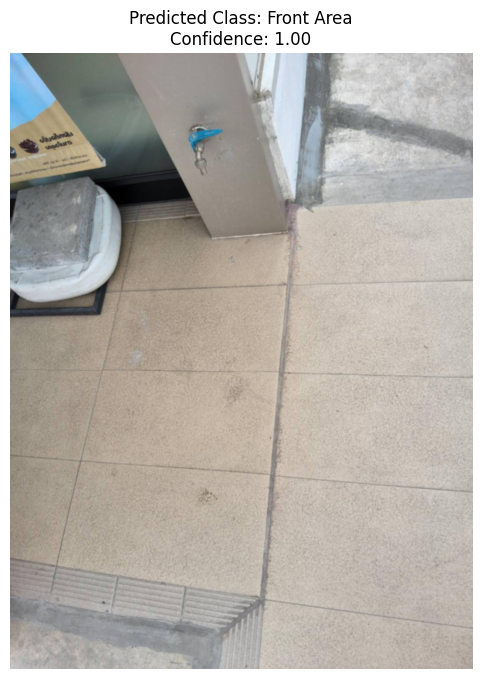

1/1 [==============================] - 0s 22ms/step


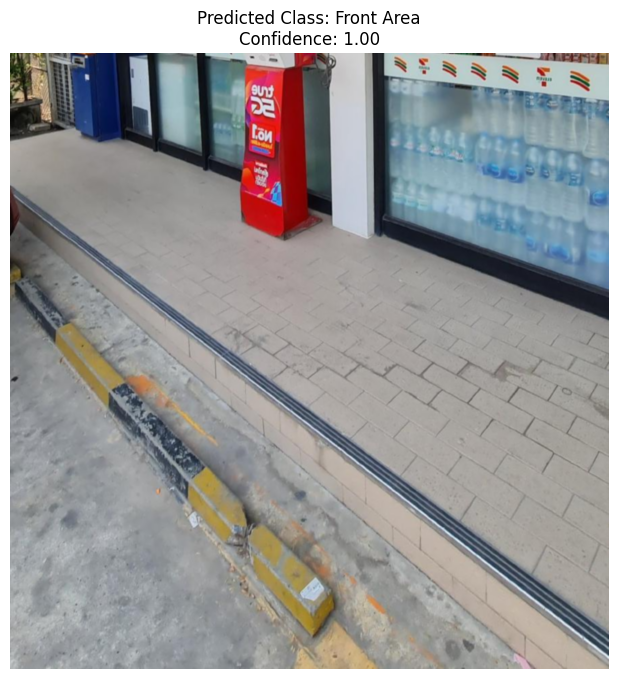

1/1 [==============================] - 0s 22ms/step


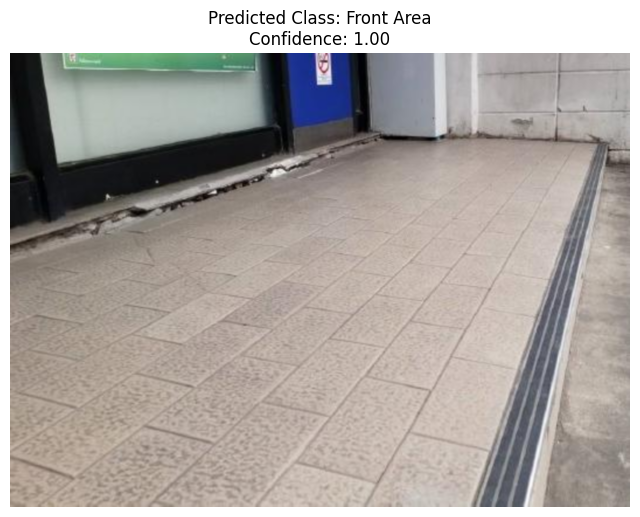

1/1 [==============================] - 0s 23ms/step


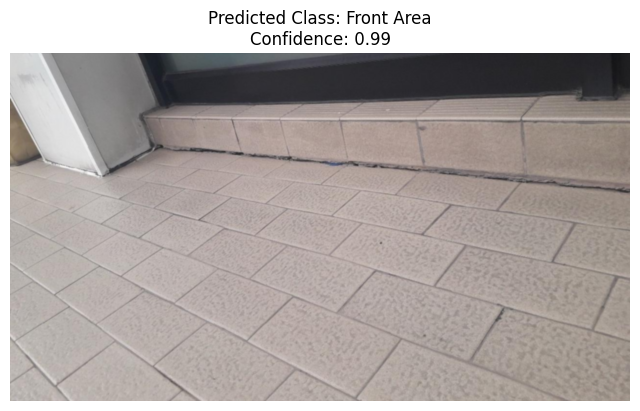

1/1 [==============================] - 0s 21ms/step


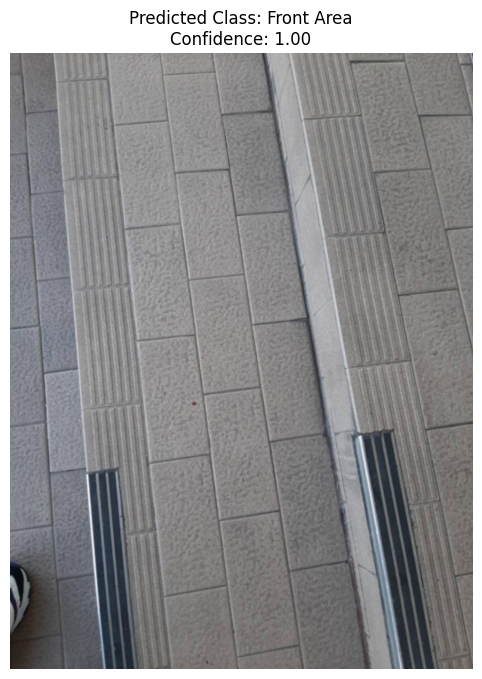

1/1 [==============================] - 0s 22ms/step


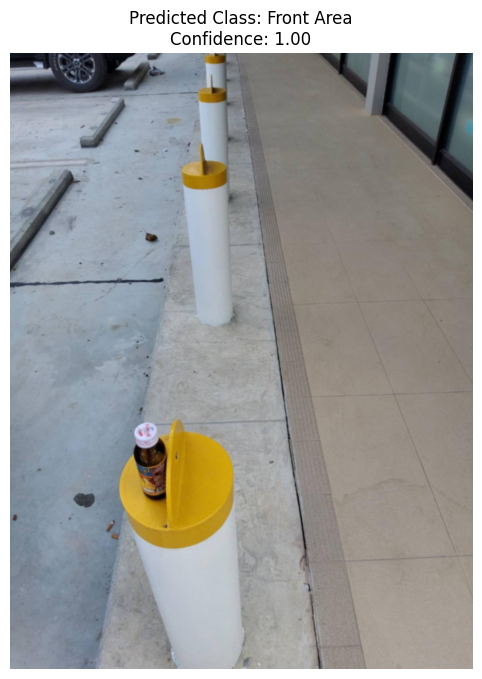

1/1 [==============================] - 0s 24ms/step


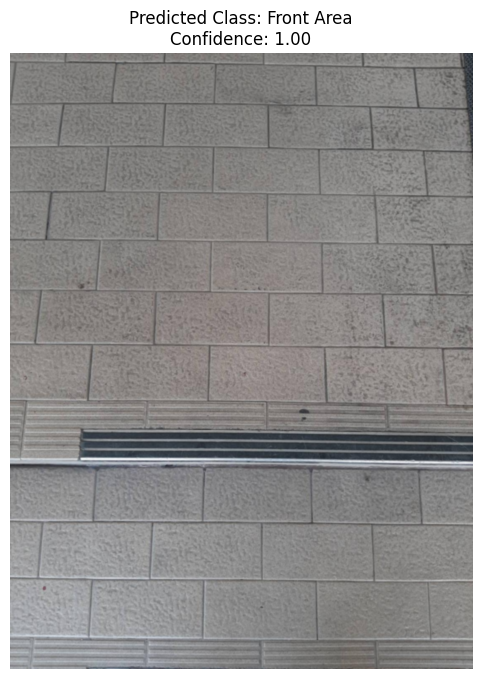

1/1 [==============================] - 0s 22ms/step


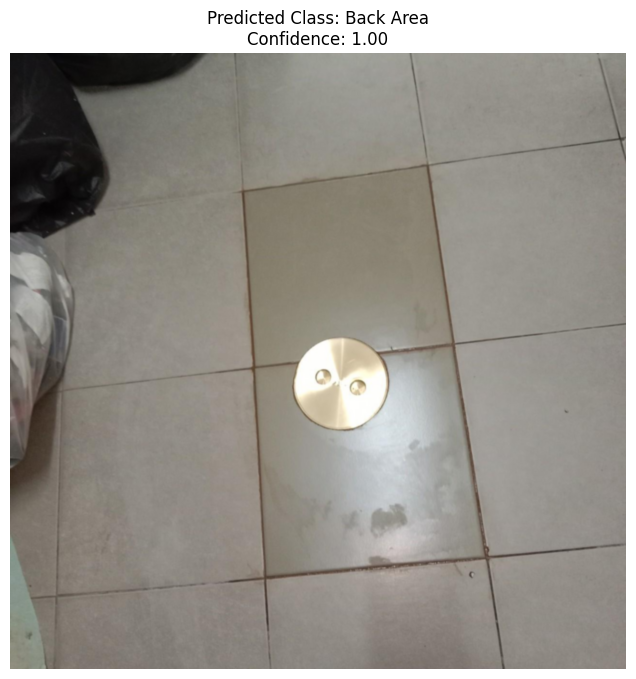

1/1 [==============================] - 0s 22ms/step


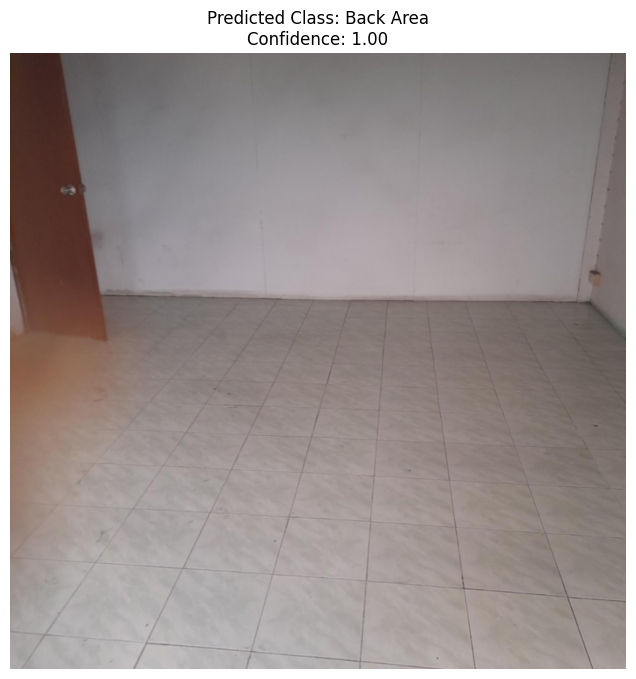

1/1 [==============================] - 0s 21ms/step


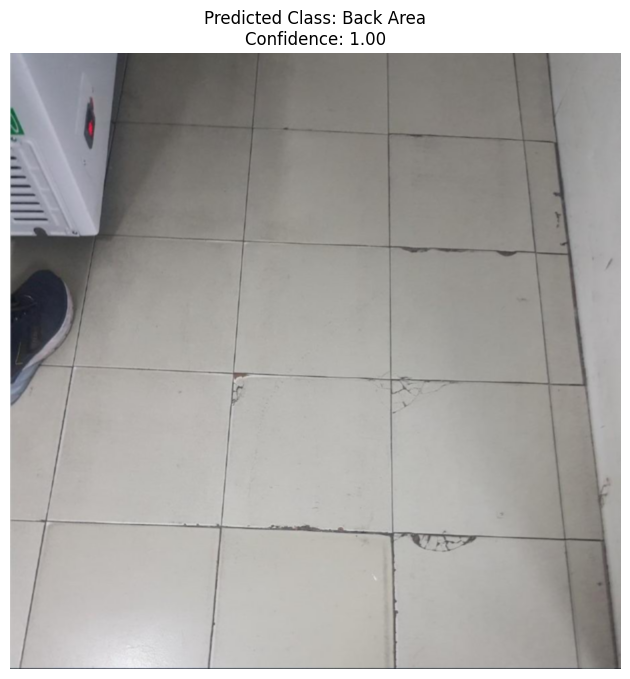

1/1 [==============================] - 0s 22ms/step


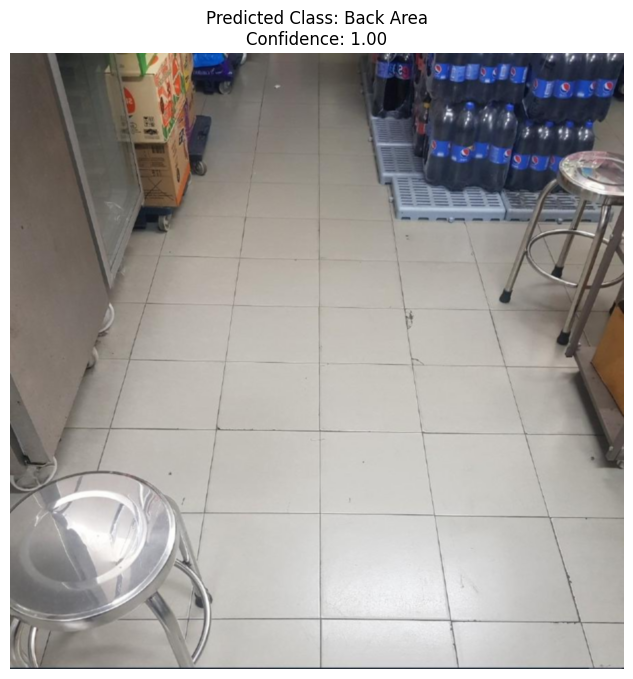

1/1 [==============================] - 0s 24ms/step


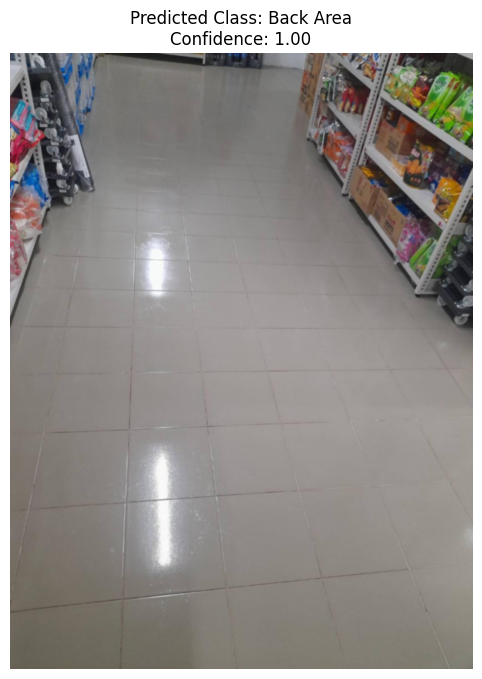

1/1 [==============================] - 0s 22ms/step


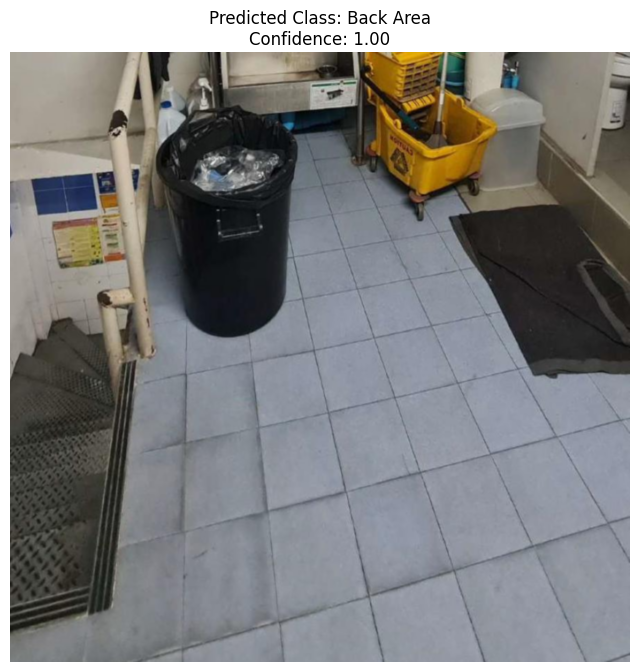

1/1 [==============================] - 0s 20ms/step


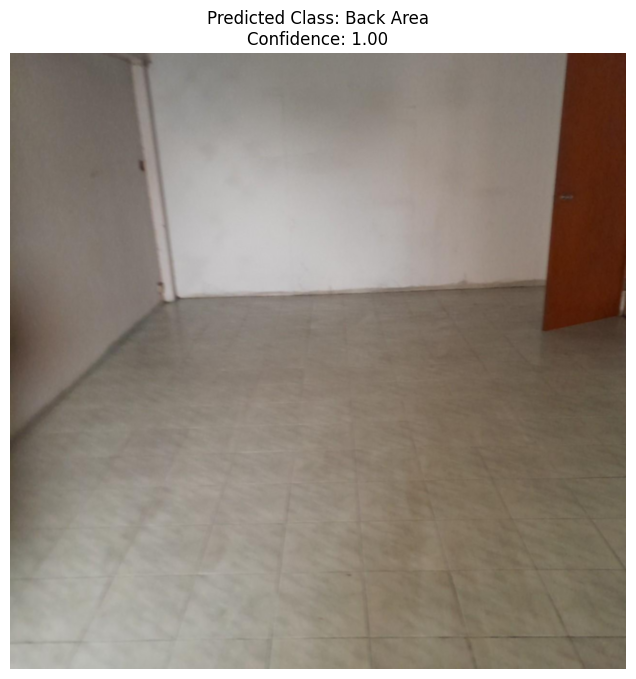

1/1 [==============================] - 0s 20ms/step


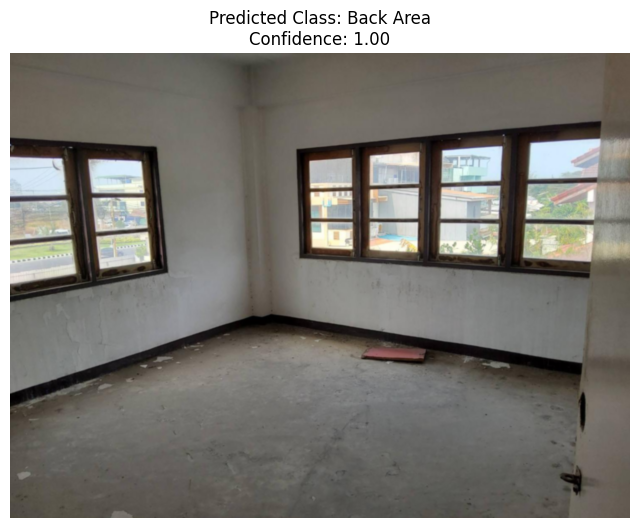

1/1 [==============================] - 0s 21ms/step


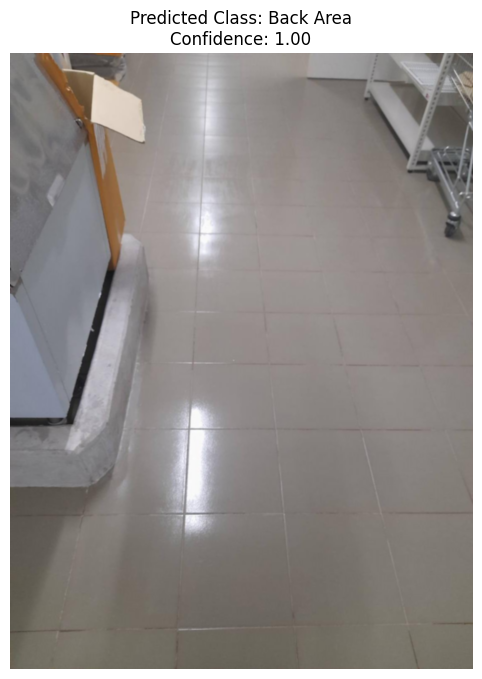

1/1 [==============================] - 0s 22ms/step


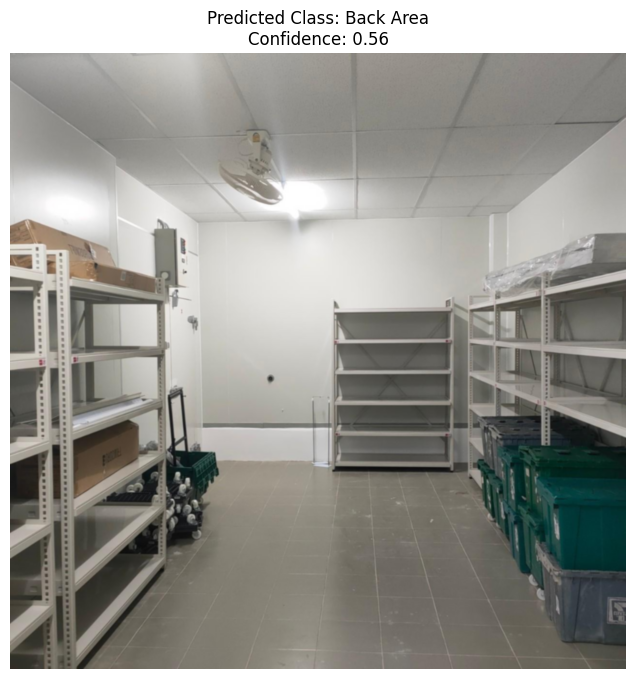

1/1 [==============================] - 0s 21ms/step


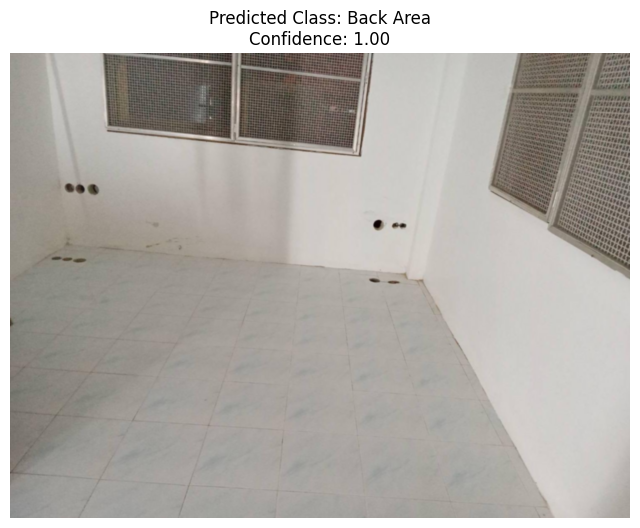

1/1 [==============================] - 0s 20ms/step


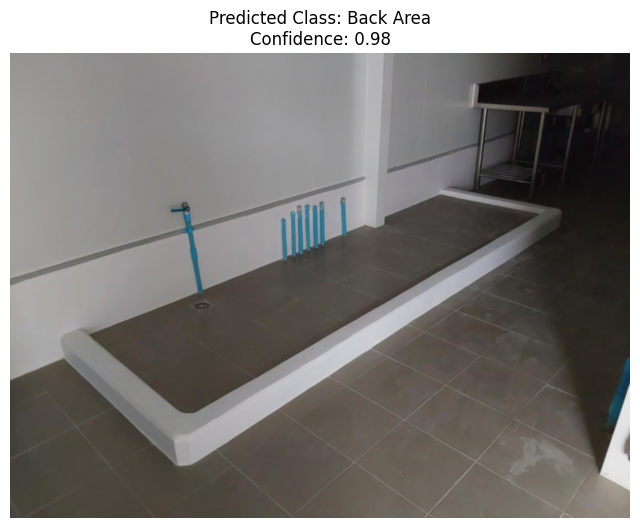

1/1 [==============================] - 0s 22ms/step


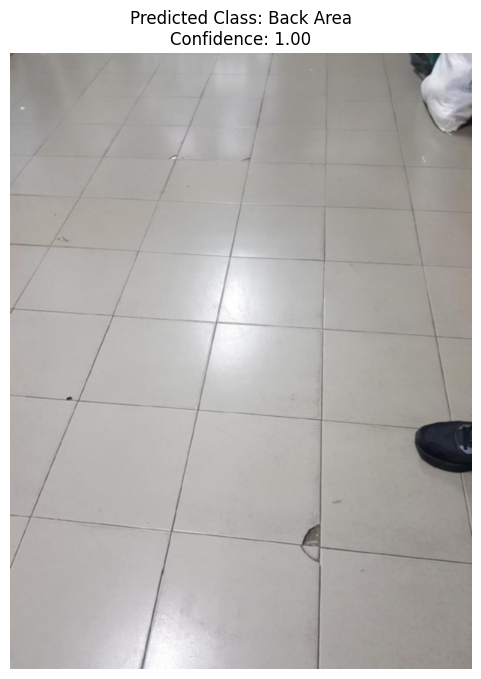

1/1 [==============================] - 0s 20ms/step


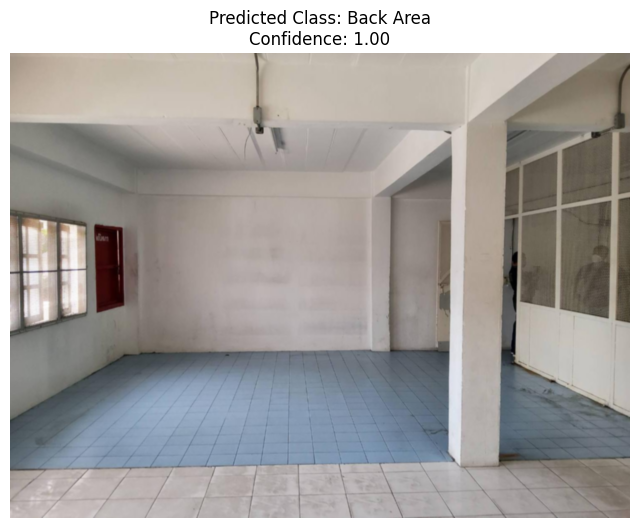

1/1 [==============================] - 0s 22ms/step


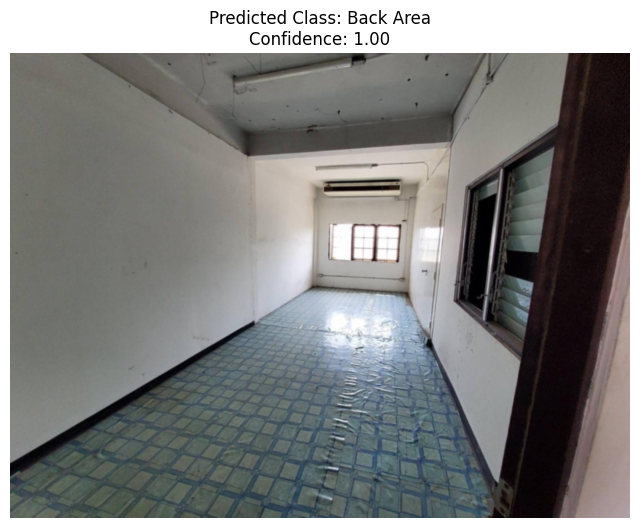

1/1 [==============================] - 0s 21ms/step


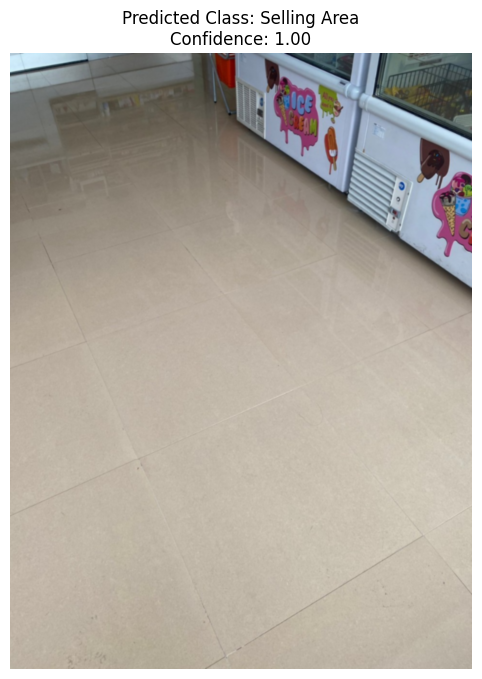

In [ ]:
class_labels_eng = {
    0: 'Selling Area',
    1: 'Front Area',
    2: 'Back Area'
}

predict_folder = '/content/drive/MyDrive/Dataset/คัดรูป(ของน้อง gen6)/กระเบื้อง/ตัวอย่างที่ผ่าน/Test_Picture_Edited'

# Load the model
model = tf.keras.models.load_model('tilemodel.h5')

# Define the target size expected by the model
target_size = (128, 128)

for image_filename in os.listdir(predict_folder):
    image_path = os.path.join(predict_folder, image_filename)
    if image_path.lower().endswith(('.png', '.jpg', '.jpeg')):  # Only predict for image files
        # Load the image and resize it to match the model's input shape
        image = tf.keras.preprocessing.image.load_img(image_path, target_size=target_size)
        image_array = tf.keras.preprocessing.image.img_to_array(image)
        image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
        image_array /= 255.0  # Normalize to [0, 1]

        # Make predictions
        predictions = model.predict(image_array)
        predicted_class_index = np.argmax(predictions[0])
        predicted_class_label = class_labels_eng.get(predicted_class_index, 'Unknown')  # Get English label
        confidence = predictions[0][predicted_class_index]  # Confidence score

        # Display the image with the predicted class label and confidence score
       # plt.figure(figsize=(8, 8))  # Adjust figure size
       # plt.imshow(image, interpolation='bicubic')  # Use 'bicubic' interpolation
       # plt.title(f"Predicted Class: {predicted_class_label}\nConfidence: {confidence:.2f}")
       # plt.axis('off')
       # plt.show()

        # Display the original size image
        original_image = tf.keras.preprocessing.image.load_img(image_path)
        plt.figure(figsize=(8, 8))  # Adjust figure size
        plt.imshow(original_image, interpolation='bicubic')  # Use 'bicubic' interpolation
        plt.title(f"Predicted Class: {predicted_class_label}\nConfidence: {confidence:.2f}")
        plt.axis('off')
        plt.show()

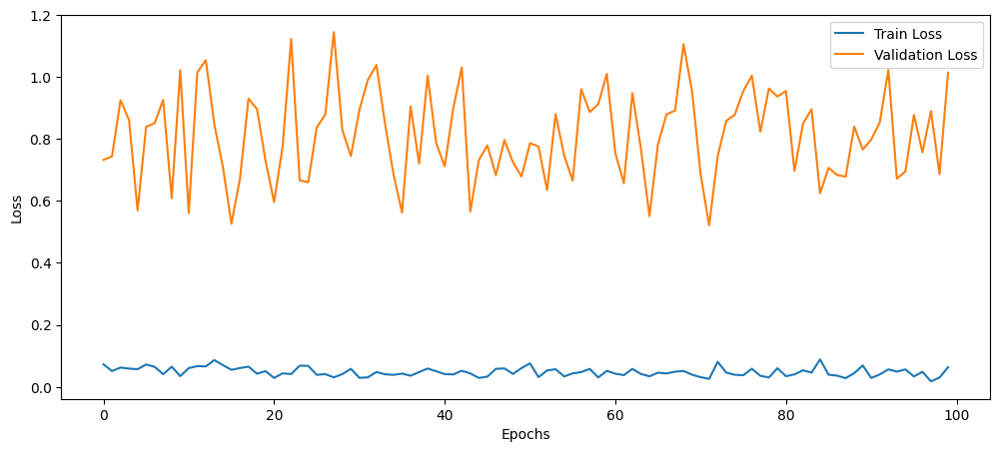

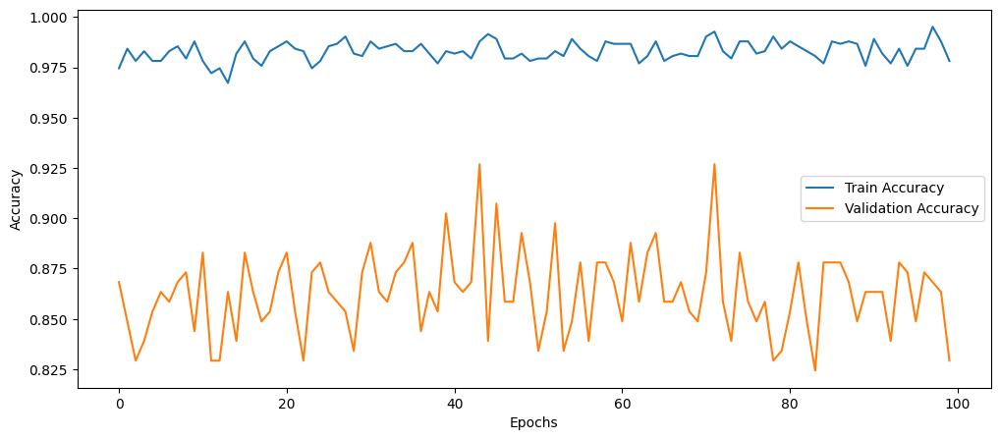

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()